# Analyse Exploratoire

### Import des modules

In [157]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings 
warnings.filterwarnings('ignore')

### Analyse Exploratoire

In [580]:
building_consumption = pd.read_csv('2016_Building_Energy_Benchmarking.csv')
building_consumption.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7226362.5,7456910.0,2003882.00,1.156514e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.00,9.504252e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,72587024.0,73937112.0,21566554.00,1.451544e+07,49526664.0,14938.00000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6794584.0,6946800.5,2214446.25,8.115253e+05,2768924.0,18112.13086,1811213.0,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,118.699997,211.399994,215.600006,14172606.0,14656503.0,0.00,1.573449e+06,5368607.0,88039.98438,8803998.0,False,NaN,Compliant,NaN,505.01,2.88


In [644]:
# On regarde comment un batiment est défini dans ce jeu de données 

# pd.set_option('display.max_columns', None)
building_consumption.head()
data = building_consumption
variable = ['BuildingType', 'PrimaryPropertyType', 'YearBuilt','SiteEUI(kBtu/sf)', 'NumberofFloors','PropertyGFATotal', 'ListOfAllPropertyUseTypes', 'SourceEUI(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'Electricity(kWh)', 'Electricity(kBtu)', 'TotalGHGEmissions', 'GHGEmissionsIntensity']

data = building_consumption[variable]
data.head()


,BuildingType,PrimaryPropertyType,YearBuilt,SiteEUI(kBtu/sf),NumberofFloors,PropertyGFATotal,ListOfAllPropertyUseTypes,SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),Electricity(kWh),Electricity(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
0,NonResidential,Hotel,1927,81.699997,12,88434,Hotel,182.500000,7226362.5,1.156514e+06,3946027.0,249.98,2.83
1,NonResidential,Hotel,1996,94.800003,11,103566,"Hotel, Parking, Restaurant",176.100006,8387933.0,9.504252e+05,3242851.0,295.86,2.86
2,NonResidential,Hotel,1969,96.000000,41,956110,Hotel,241.899994,72587024.0,1.451544e+07,49526664.0,2089.28,2.19
3,NonResidential,Hotel,1926,110.800003,10,61320,Hotel,216.199997,6794584.0,8.115253e+05,2768924.0,286.43,4.67
4,NonResidential,Hotel,1980,114.800003,18,175580,"Hotel, Parking, Swimming Pool",211.399994,14172606.0,1.573449e+06,5368607.0,505.01,2.88


In [646]:
# On regarde le nombre de valeurs manquantes par colonne ainsi que leur type 
building_consumption.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3376 entries, 0 to 3375
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    3376 non-null   int64  
 1   DataYear                         3376 non-null   int64  
 2   BuildingType                     3376 non-null   object 
 3   PrimaryPropertyType              3376 non-null   object 
 4   PropertyName                     3376 non-null   object 
 5   Address                          3376 non-null   object 
 6   City                             3376 non-null   object 
 7   State                            3376 non-null   object 
 8   ZipCode                          3360 non-null   float64
 9   TaxParcelIdentificationNumber    3376 non-null   object 
 10  CouncilDistrictCode              3376 non-null   int64  
 11  Neighborhood                     3376 non-null   object 
 12  Latitude            

In [648]:
data.PrimaryPropertyType.value_counts(dropna = False)

PrimaryPropertyType
Low-Rise Multifamily           987
Mid-Rise Multifamily           564
Small- and Mid-Sized Office    293
Other                          256
Warehouse                      187
Large Office                   173
K-12 School                    139
Mixed Use Property             133
High-Rise Multifamily          105
Retail Store                    91
Hotel                           77
Worship Facility                71
Distribution Center             53
Senior Care Community           45
Supermarket / Grocery Store     40
Medical Office                  39
Self-Storage Facility           28
University                      25
Residence Hall                  23
Refrigerated Warehouse          12
Restaurant                      12
Hospital                        10
Laboratory                      10
Office                           3
Name: count, dtype: int64

In [650]:
data.BuildingType.value_counts(dropna = False)

BuildingType
NonResidential          1460
Multifamily LR (1-4)    1018
Multifamily MR (5-9)     580
Multifamily HR (10+)     110
SPS-District K-12         98
Nonresidential COS        85
Campus                    24
Nonresidential WA          1
Name: count, dtype: int64

In [652]:
data.shape

(3376, 13)

In [654]:
data.columns

Index(['BuildingType', 'PrimaryPropertyType', 'YearBuilt', 'SiteEUI(kBtu/sf)',
       'NumberofFloors', 'PropertyGFATotal', 'ListOfAllPropertyUseTypes',
       'SourceEUI(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'Electricity(kWh)',
       'Electricity(kBtu)', 'TotalGHGEmissions', 'GHGEmissionsIntensity'],
      dtype='object')

([0, 1, 2, 3, 4, 5, 6, 7],
 [Text(0, 0, 'NonResidential'),
  Text(1, 0, 'Nonresidential COS'),
  Text(2, 0, 'Multifamily MR (5-9)'),
  Text(3, 0, 'SPS-District K-12'),
  Text(4, 0, 'Campus'),
  Text(5, 0, 'Multifamily LR (1-4)'),
  Text(6, 0, 'Multifamily HR (10+)'),
  Text(7, 0, 'Nonresidential WA')])

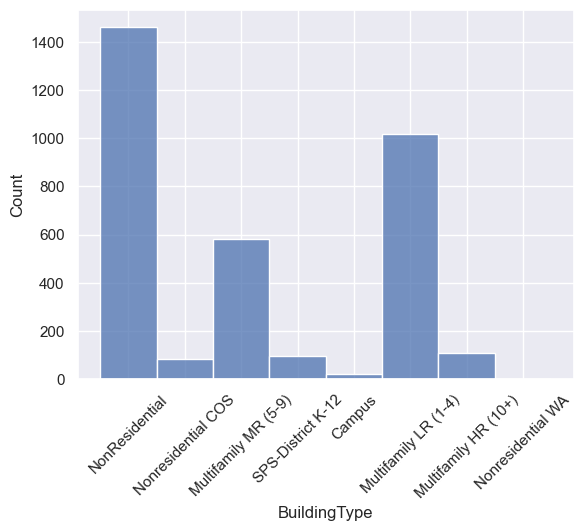

In [656]:
sns.histplot(data['BuildingType']);
plt.xticks(rotation=45)

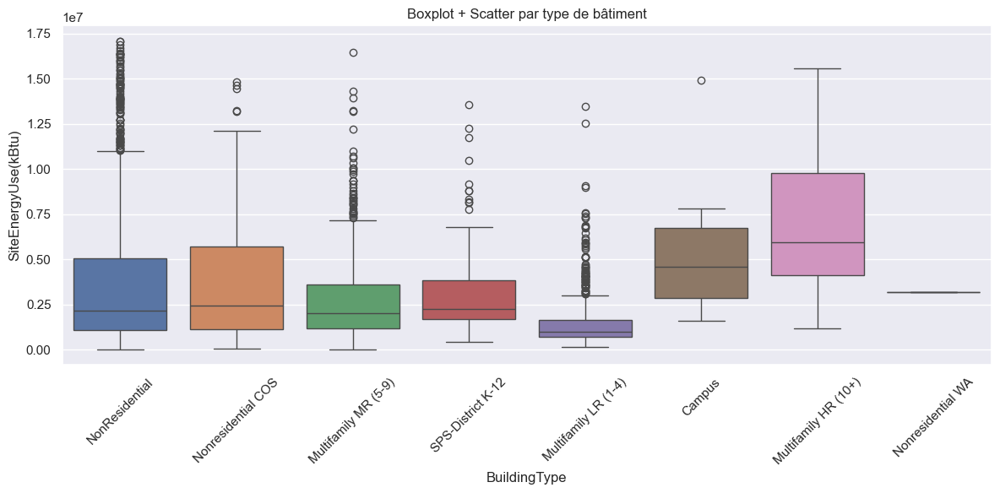

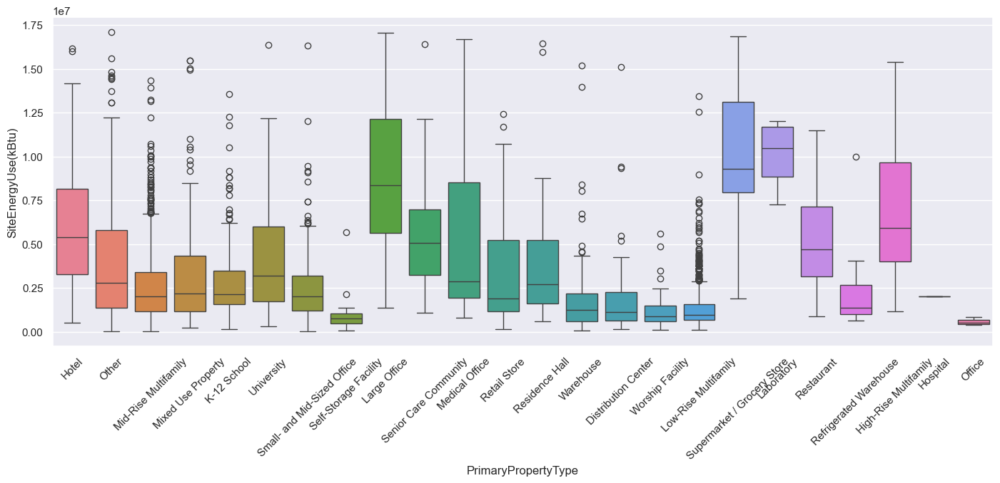

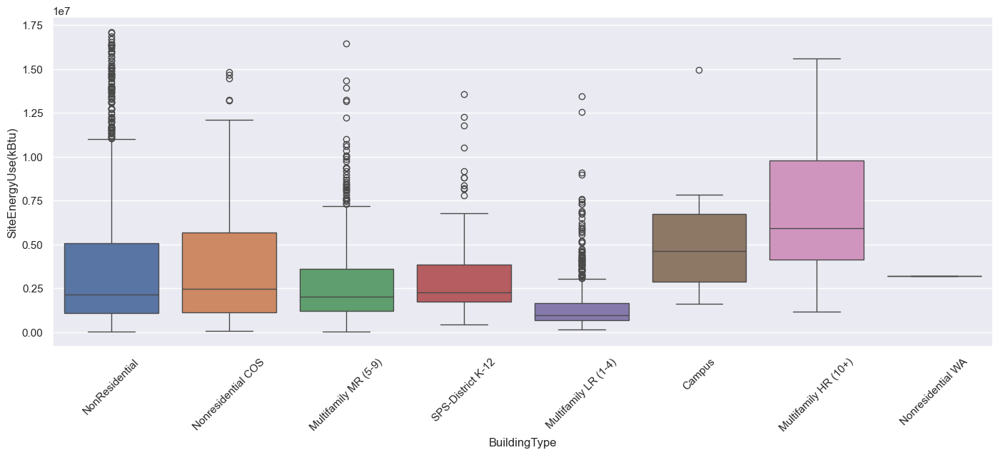

In [659]:
df = data[data["SiteEnergyUse(kBtu)"] > 1].copy()

# Étape 2 : Suppression des outliers avec la méthode IQR
Q1 = df["SiteEnergyUse(kBtu)"].quantile(0.15)
Q3 = df["SiteEnergyUse(kBtu)"].quantile(0.85)
IQR = Q3 - Q1

# Garder uniquement les points à l'intérieur de [Q1 - 1.5*IQR, Q3 + 1.5*IQR]
filtered_df = df[(df["SiteEnergyUse(kBtu)"] >= Q1 - 1.5 * IQR) & (df["SiteEnergyUse(kBtu)"] <= Q3 + 1.5 * IQR)]
plt.figure(figsize=(12, 6))
sns.boxplot(
    data= filtered_df,
    x='BuildingType',
    y='SiteEnergyUse(kBtu)',hue='BuildingType'
  
)

plt.xticks(rotation=45)
plt.title("Boxplot + Scatter par type de bâtiment")
plt.ylabel("SiteEnergyUse(kBtu)")
plt.tight_layout()
plt.show()



plt.figure(figsize=(17, 6))
plt.xticks(rotation=45)
sns.boxplot(
    data= filtered_df,
    x='PrimaryPropertyType',
    y='SiteEnergyUse(kBtu)',hue='PrimaryPropertyType'
  
)
plt.show()
plt.figure(figsize=(17, 6))
plt.xticks(rotation=45)
sns.boxplot(
    data= filtered_df,
    x='BuildingType',
    y='SiteEnergyUse(kBtu)',hue='BuildingType'
  
)
plt.show()


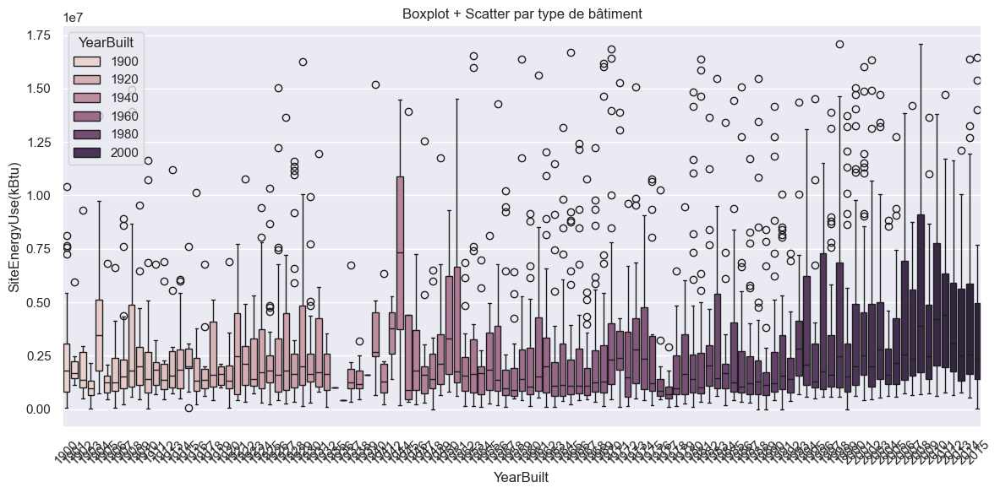

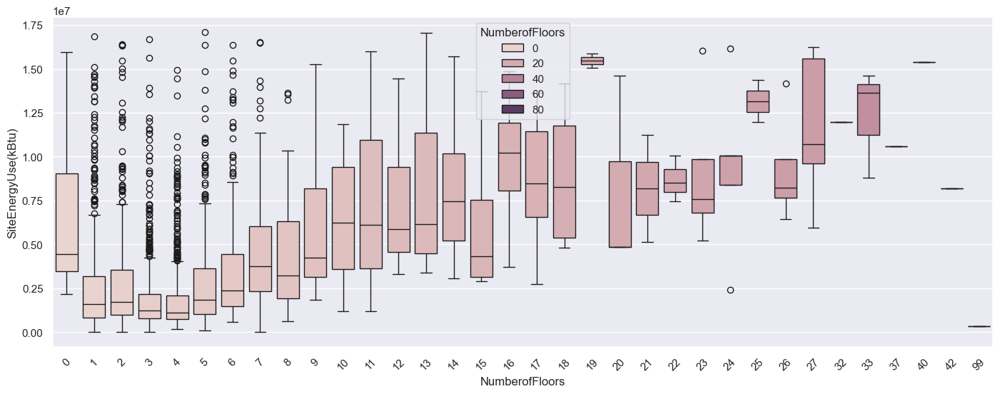

In [660]:
df = data[data["Electricity(kBtu)"] > 1].copy()

# Étape 2 : Suppression des outliers avec la méthode IQR
Q1 = df["SiteEnergyUse(kBtu)"].quantile(0.15)
Q3 = df["SiteEnergyUse(kBtu)"].quantile(0.85)
IQR = Q3 - Q1

# Garder uniquement les points à l'intérieur de [Q1 - 1.5*IQR, Q3 + 1.5*IQR]
filtered_df = df[(df["SiteEnergyUse(kBtu)"] >= Q1 - 1.5 * IQR) & (df["SiteEnergyUse(kBtu)"] <= Q3 + 1.5 * IQR)]
plt.figure(figsize=(12, 6))
sns.boxplot(
    data= filtered_df,
    x='YearBuilt',
    y='SiteEnergyUse(kBtu)',hue='YearBuilt'
  
)

plt.xticks(rotation=45)
plt.title("Boxplot + Scatter par type de bâtiment")
plt.ylabel("SiteEnergyUse(kBtu)")
plt.tight_layout()
plt.show()



plt.figure(figsize=(17, 6))
plt.xticks(rotation=45)
sns.boxplot(
    data= filtered_df,
    x='NumberofFloors',
    y='SiteEnergyUse(kBtu)',hue='NumberofFloors'
  
)
plt.show()


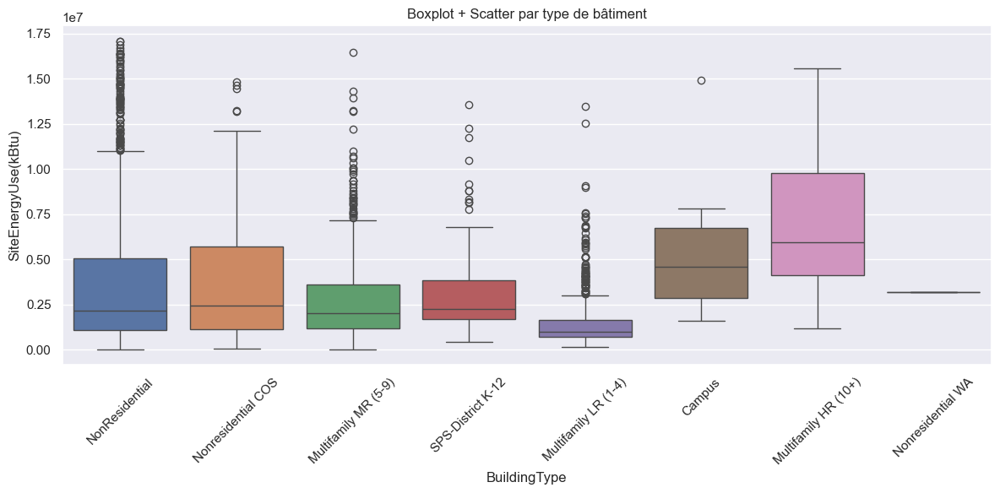

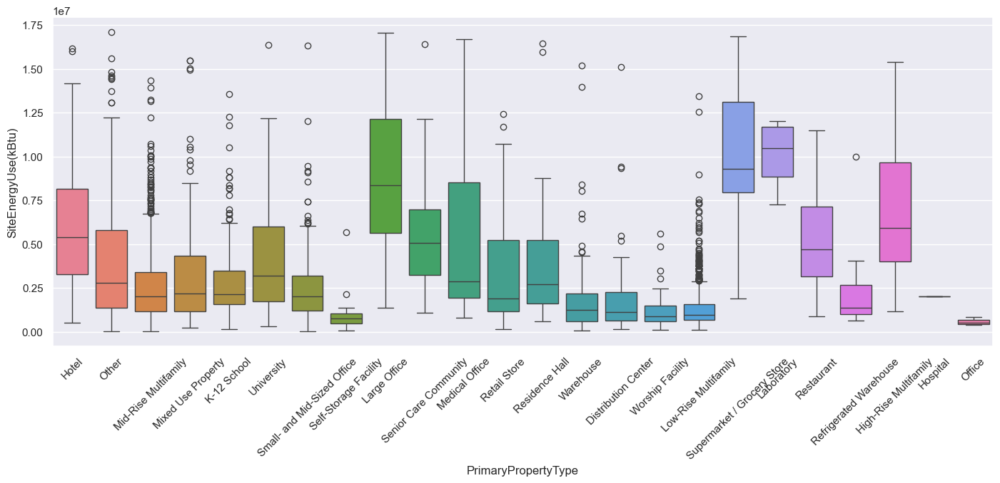

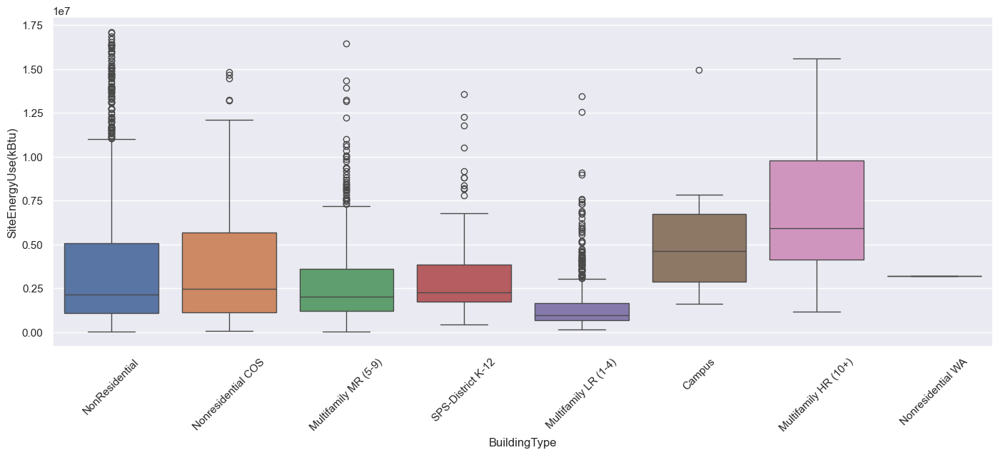

In [662]:

df = building_consumption[building_consumption["SiteEnergyUse(kBtu)"] > 1].copy()

# Étape 2 : Suppression des outliers avec la méthode IQR
Q1 = df["SiteEnergyUse(kBtu)"].quantile(0.15)
Q3 = df["SiteEnergyUse(kBtu)"].quantile(0.85)
IQR = Q3 - Q1

# Garder uniquement les points à l'intérieur de [Q1 - 1.5*IQR, Q3 + 1.5*IQR]
filtered_df = df[(df["SiteEnergyUse(kBtu)"] >= Q1 - 1.5 * IQR) & (df["SiteEnergyUse(kBtu)"] <= Q3 + 1.5 * IQR)]
plt.figure(figsize=(12, 6))
sns.boxplot(
    data= filtered_df,
    x='BuildingType',
    y='SiteEnergyUse(kBtu)',hue='BuildingType'
  
)

plt.xticks(rotation=45)
plt.title("Boxplot + Scatter par type de bâtiment")
plt.ylabel("SiteEnergyUse(kBtu)")
plt.tight_layout()
plt.show()



plt.figure(figsize=(17, 6))
plt.xticks(rotation=45)
sns.boxplot(
    data= filtered_df,
    x='PrimaryPropertyType',
    y='SiteEnergyUse(kBtu)',hue='PrimaryPropertyType'
  
)
plt.show()
plt.figure(figsize=(17, 6))
plt.xticks(rotation=45)
sns.boxplot(
    data= filtered_df,
    x='BuildingType',
    y='SiteEnergyUse(kBtu)',hue='BuildingType'
  
)
plt.show()

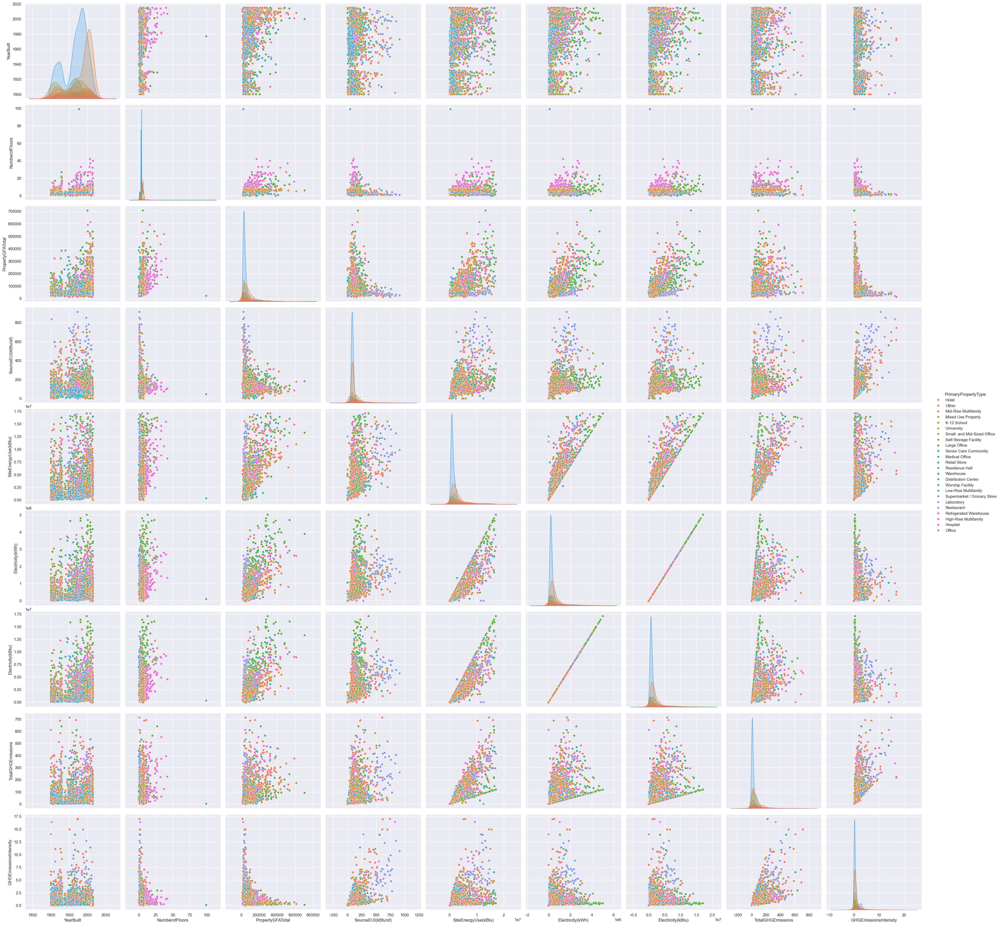

In [663]:
sns.set()
cols = ['BuildingType', 'PrimaryPropertyType', 'YearBuilt', 'NumberofFloors', 'PropertyGFATotal', 'ListOfAllPropertyUseTypes', 'SourceEUI(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'Electricity(kWh)', 'Electricity(kBtu)', 'TotalGHGEmissions', 'GHGEmissionsIntensity']

sns.pairplot(filtered_df[cols], hue='PrimaryPropertyType', height=4)
plt.show();

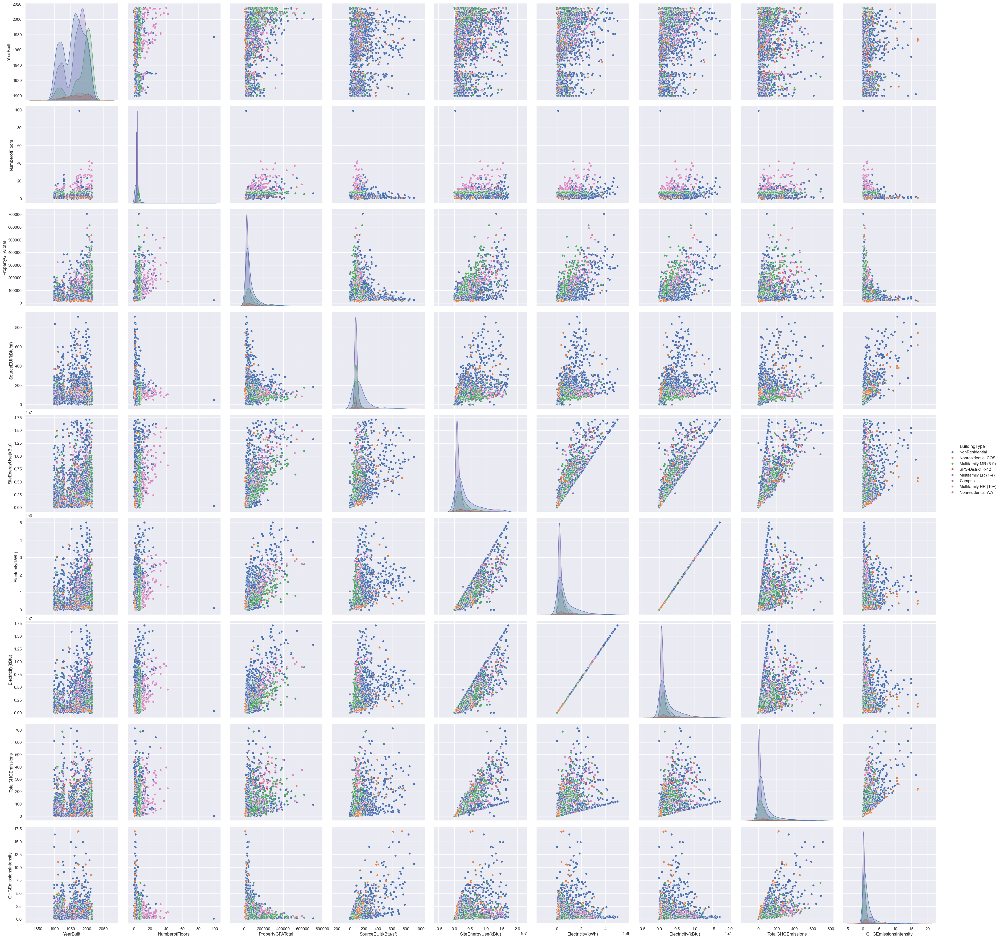

In [664]:
sns.set()
cols = ['BuildingType', 'PrimaryPropertyType', 'YearBuilt', 'NumberofFloors', 'PropertyGFATotal', 'ListOfAllPropertyUseTypes', 'SourceEUI(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'Electricity(kWh)', 'Electricity(kBtu)', 'TotalGHGEmissions', 'GHGEmissionsIntensity']

sns.pairplot(filtered_df[cols], hue='BuildingType', height=4)
plt.show();

* Identifier les colonnes avec une majorité de valeurs manquantes ou constantes en utilisant la méthode value_counts() de Pandas
* Mettre en evidence les différences entre les immeubles mono et multi-usages
* Utiliser des pairplots et des boxplots pour faire ressortir les outliers ou des batiments avec des valeurs peu cohérentes d'un point de vue métier 

Pour vous inspirer, ou comprendre l'esprit recherché dans une analyse exploratoire, vous pouvez consulter ce notebook en ligne : https://www.kaggle.com/code/pmarcelino/comprehensive-data-exploration-with-python. Il ne s'agit pas d'un modèle à suivre à la lettre ni d'un template d'analyses attendues pour ce projet. 

# Modélisation 

### Import des modules 

In [671]:
#Selection
from sklearn.model_selection import (
    train_test_split,
    GridSearchCV, 
    cross_validate,
)
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error 
from sklearn.inspection import permutation_importance

#Preprocess
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler

#Modèles
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor


### Feature Engineering

A réaliser : Enrichir le jeu de données actuel avec de nouvelles features issues de celles existantes. 

En règle générale : On utilise la méthode .apply() de Pandas pour créer une nouvelle colonne à partir d'une colonne existante. N'hésitez pas à regarder les exemples dans les chapitres de cours donnés en ressource

In [675]:
data[(data['SiteEnergyUse(kBtu)'] == 0) & (data['TotalGHGEmissions'] == 0)].shape


(7, 13)

In [676]:
data[(data['SiteEnergyUse(kBtu)'] == 0) & (data['TotalGHGEmissions'] == 0)].BuildingType.value_counts(dropna = False)

BuildingType
SPS-District K-12       3
NonResidential          2
Multifamily LR (1-4)    2
Name: count, dtype: int64

Text(0.5, 1.0, 'totalEmissionsSiteEnergyUse')

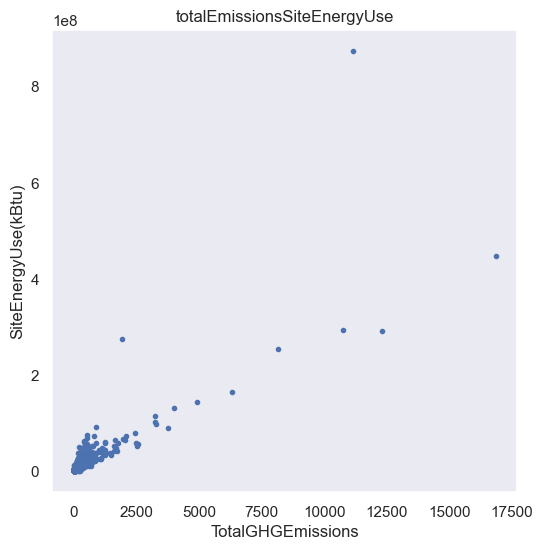

In [677]:
fig = plt.figure(figsize=(6, 6))
plt.plot(data['TotalGHGEmissions'], data['SiteEnergyUse(kBtu)'], '.')
plt.grid()
plt.xlabel('TotalGHGEmissions')
plt.ylabel('SiteEnergyUse(kBtu)')
plt.title('totalEmissionsSiteEnergyUse')

In [678]:
filtered_data = data[(data['SiteEnergyUse(kBtu)'] < 1e7) & (data['TotalGHGEmissions'] < 1e4)].copy()
filtered_data.shape[0]


3021

Text(0.5, 1.0, 'totalEmissionsSiteEnergyUse')

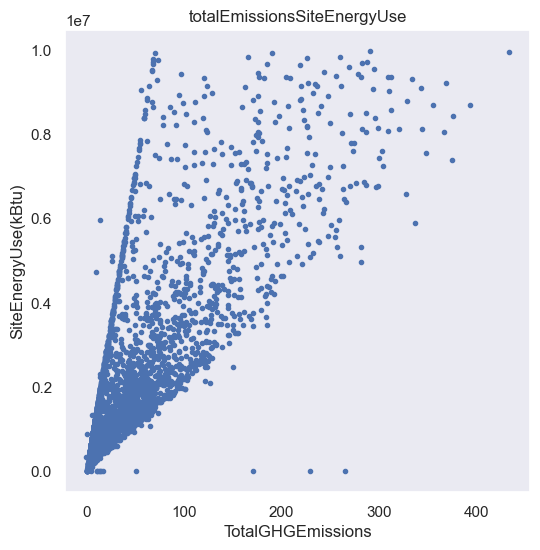

In [679]:
fig = plt.figure(figsize=(6, 6))
plt.plot(filtered_data['TotalGHGEmissions'], filtered_data['SiteEnergyUse(kBtu)'], '.')
plt.grid()
plt.xlabel('TotalGHGEmissions')
plt.ylabel('SiteEnergyUse(kBtu)')
plt.title('totalEmissionsSiteEnergyUse')

In [680]:

nonres_types = [
    'NonResidential',
    'Nonresidential COS',
    'SPS-District K-12',
    'Nonresidential WA'
]
nonres_data = data.loc[data['BuildingType'].isin(nonres_types)].copy()
nonres_data.head()

,BuildingType,PrimaryPropertyType,YearBuilt,SiteEUI(kBtu/sf),NumberofFloors,PropertyGFATotal,ListOfAllPropertyUseTypes,SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),Electricity(kWh),Electricity(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
0,NonResidential,Hotel,1927,81.699997,12,88434,Hotel,182.500000,7226362.5,1.156514e+06,3946027.0,249.98,2.83
1,NonResidential,Hotel,1996,94.800003,11,103566,"Hotel, Parking, Restaurant",176.100006,8387933.0,9.504252e+05,3242851.0,295.86,2.86
2,NonResidential,Hotel,1969,96.000000,41,956110,Hotel,241.899994,72587024.0,1.451544e+07,49526664.0,2089.28,2.19
3,NonResidential,Hotel,1926,110.800003,10,61320,Hotel,216.199997,6794584.0,8.115253e+05,2768924.0,286.43,4.67
4,NonResidential,Hotel,1980,114.800003,18,175580,"Hotel, Parking, Swimming Pool",211.399994,14172606.0,1.573449e+06,5368607.0,505.01,2.88


In [681]:
# enlevons les echantillons pour lesquels domanialite manque
df = nonres_data[~nonres_data.BuildingType.isna()].copy()
df.reset_index(drop = True, inplace = True)
from sklearn import preprocessing
enc = preprocessing.OneHotEncoder()
labels = enc.fit_transform(df.BuildingType.values.reshape(-1, 1)).toarray()
labels.shape

(1644, 4)

In [682]:
labels

array([[1., 0., 0., 0.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.],
       ...,
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.]], shape=(1644, 4))

In [683]:
new_columns = [ f"is_{col.lower()}" for col in df.BuildingType.unique()   ]
new_columns

['is_nonresidential',
 'is_nonresidential cos',
 'is_sps-district k-12',
 'is_nonresidential wa']

In [684]:
df = pd.concat([df, 
        pd.DataFrame(columns = new_columns[:-1], data = labels[:, :-1])], 
        axis = 1)

In [685]:
for col in new_columns[:-1]:
    df[col] = df[col].astype(int)


In [686]:
df[['BuildingType'] + new_columns[:-1]].sample(5, random_state = 88)

,BuildingType,is_nonresidential,is_nonresidential cos,is_sps-district k-12
1428,NonResidential,1,0,0
1344,NonResidential,1,0,0
1258,NonResidential,1,0,0
957,NonResidential,1,0,0
492,NonResidential,1,0,0


In [687]:
for col in new_columns[:-1]:
    print( f" {col}: \t {np.round(100.0*(1 - df[col].sum()/ df.shape[0]), 2)}% "  )

 is_nonresidential: 	 11.19% 
 is_nonresidential cos: 	 94.83% 
 is_sps-district k-12: 	 99.94% 


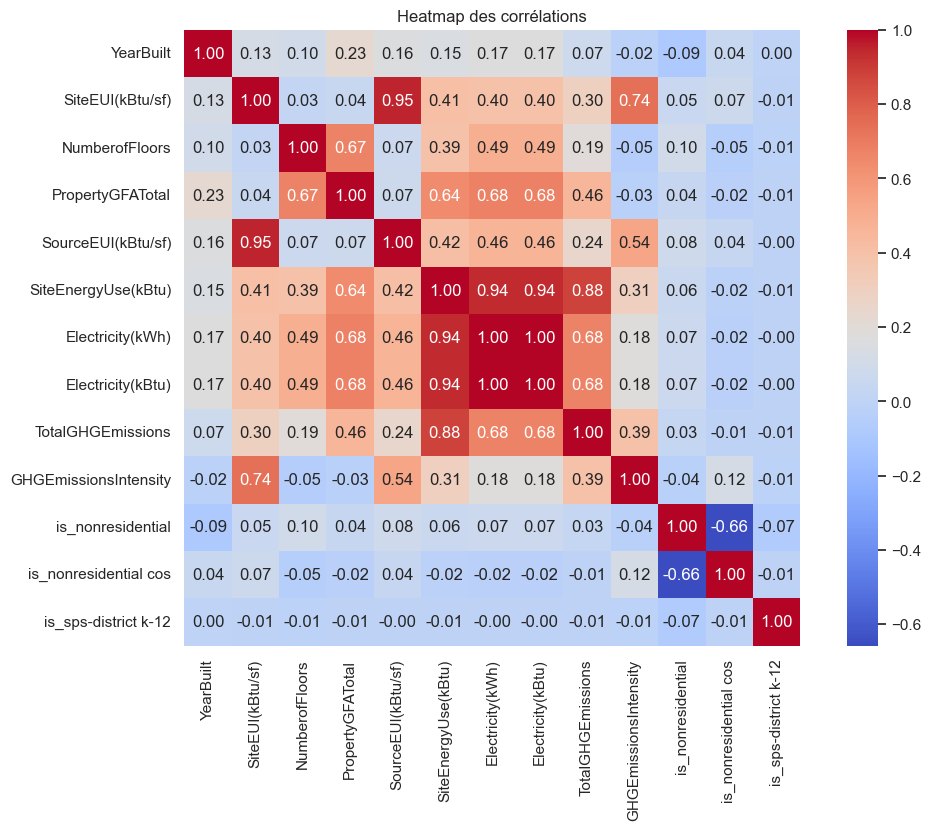

In [688]:

num_cols = df.select_dtypes(include=['float64', 'int64']).columns
corr_matrix = df[num_cols].corr(method='pearson')
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title("Heatmap des corrélations")
plt.show()

### Préparation des features pour la modélisation

A réaliser :
* Si ce n'est pas déjà fait, supprimer toutes les colonnes peu pertinentes pour la modélisation.
* Tracer la distribution de la cible pour vous familiariser avec l'ordre de grandeur. En cas d'outliers, mettez en place une démarche pour les supprimer.
* Débarrassez-vous des features redondantes en utilisant une matrice de corrélation de Pearson. Pour cela, utiisez la méthode corr() de Pandas, couplé d'un graphique Heatmap de la librairie Seaborn 
* Réalisez différents graphiques pour comprendre le lien entre vos features et la target (boxplots, scatterplots, pairplot si votre nombre de features numériques n'est pas très élevé).
*  Séparez votre jeu de données en un Pandas DataFrame X (ensemble de feautures) et Pandas Series y (votre target).
* Si vous avez des features catégorielles, il faut les encoder pour que votre modèle fonctionne. Les deux méthodes d'encodage à connaitre sont le OneHotEncoder et le LabelEncoder

In [ ]:
# CODE PREPARATION DES FEATURES

### Comparaison de différents modèles supervisés

A réaliser :
* Pour chaque algorithme que vous allez tester, vous devez :
    * Réaliser au préalable une séparation en jeu d'apprentissage et jeu de test via une validation croisée.
    * Si les features quantitatives que vous souhaitez utiliser ont des ordres de grandeur très différents les uns des autres, et que vous utilisez un algorithme de regression qui est sensible à cette différence, alors il faut réaliser un scaling (normalisation) de la donnée au préalable.
    * Entrainer le modèle sur le jeu de Train
    * Prédire la cible sur la donnée de test (nous appelons cette étape, l'inférence).
    * Calculer les métriques de performance R2, MAE et RMSE sur le jeu de train et de test.
    * Interpréter les résultats pour juger de la fiabilité de l'algorithme.
* Vous pouvez choisir par exemple de tester un modèle linéaire, un modèle à base d'arbres et un modèle de type SVM
* Déterminer le modèle le plus performant parmi ceux testés.

In [1]:
# CODE COMPARAISON DES MODELES

### Optimisation et interprétation du modèle

A réaliser :
* Reprennez le meilleur algorithme que vous avez sécurisé via l'étape précédente, et réalisez une GridSearch de petite taille sur au moins 3 hyperparamètres.
* Si le meilleur modèle fait partie de la famille des modèles à arbres (RandomForest, GradientBoosting) alors utilisez la fonctionnalité feature importance pour identifier les features les plus impactantes sur la performance du modèle. Sinon, utilisez la méthode Permutation Importance de sklearn.

In [ ]:
# CODE OPTIMISATION ET INTERPRETATION DU MODELE